# Analysis of data from public WhatsApp groups
Exploration and visualization of the data set

In [18]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from unidecode import unidecode
import unicodedata, re, itertools, sys
from urllib.request import urlopen
import json
import plotly.express as px

%matplotlib inline

sns.set(style="darkgrid")

In [19]:
base = 2018
show = False

In [20]:
filepath = 'data/' + str(base) + '/fakeWhatsApp.BR_' + str(base) + '.csv'
df = pd.read_csv(filepath)  #('data/2020/wpp_2020_stage1.csv')
df.head(5)

/home/cabral/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3049: DtypeWarning: Columns (3,6) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,id,date,hour,ddi,country,country_iso3,ddd,state,group,midia,url,characters,words,viral,sharings,text,misinformation
0,3631133147603888180,01/08/18,13:13,55,BRASIL,BRA,17,São Paulo,2018_1,1,0,25,4,0,1,<Arquivo de mídia oculto>,0
1,3631133147603888180,01/08/18,13:24,55,BRASIL,BRA,17,São Paulo,2018_1,0,0,58,9,1,2,O Bolsonaro tem que estar preparado pra respon...,0
2,3631133147603888180,01/08/18,13:24,55,BRASIL,BRA,17,São Paulo,2018_1,1,0,25,4,0,1,<Arquivo de mídia oculto>,0
3,-4391661641377612003,01/08/18,13:28,55,BRASIL,BRA,13,São Paulo,2018_1,0,0,5,1,0,1,Boaaa,0
4,-4391661641377612003,09/08/18,14:46,55,BRASIL,BRA,13,São Paulo,2018_1,1,0,25,4,0,1,<Arquivo de mídia oculto>,0


In [21]:
# UNCOMMENT ONLY IF NOT LABELLED YET!!!!
#df['misinformation'] = [0]*len(df)

# Basic statistics

In [22]:
df.describe()[['characters','words','sharings']]

,characters,words,sharings
count,282601.000000,282601.000000,282601.000000
mean,97.638688,14.962091,1.755716
std,407.238452,61.842076,5.122241
min,1.000000,1.000000,1.000000
25%,25.000000,4.000000,1.000000
50%,25.000000,4.000000,1.000000
75%,43.000000,7.000000,1.000000
max,65536.000000,5486.000000,91.000000


In [23]:
total_msg = len(df)
total_groups = len(df['group'].unique())
total_users = len(df['id'].unique())
print('Total groups analyzed: ',total_groups)
print('Total unique users: ', total_users)
print('Total messages: ', total_msg)
print('Message/user ratio: ', total_msg/len(df['id'].unique()))

Total groups analyzed:  59
Total unique users:  5364
Total messages:  282601
Message/user ratio:  52.68475018642804


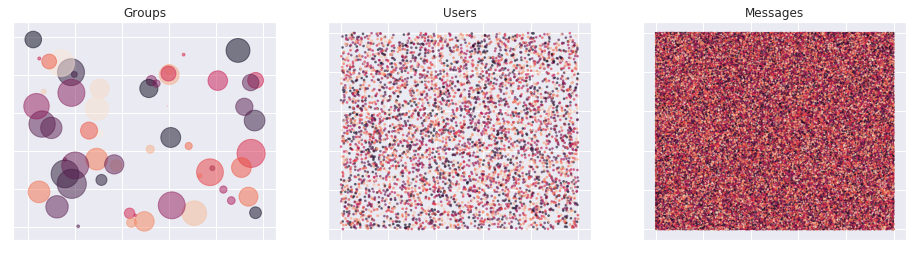

In [24]:
#Visualization of scale
# Fixing random state for reproducibility
np.random.seed(42)

plt.figure(figsize=(16, 4))

### grupos
N = total_groups
x = np.random.rand(N)
y = np.random.rand(N)
colors = np.random.rand(N)
area = (30 * np.random.rand(N))**2  # 0 to 15 point radii

plt.subplot(131)
plt.title('Groups')
plt.scatter(x, y, s=area, c=colors, alpha=0.5)
plt.tick_params(
    axis = 'both',
    left = False,
    right = False,
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False,
    labelleft = False) # labels along the bottom edge are off

#####users
N = total_users
x = np.random.rand(N)
y = np.random.rand(N)
colors = np.random.rand(N)

plt.subplot(132)
plt.title('Users')
plt.scatter(x, y, s=3, c=colors, alpha=0.5)
plt.tick_params(
    axis = 'both',
    left = False,
    right = False,
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False,
    labelleft = False) # labels along the bottom edge are off

#####msgs
N = total_msg
x = np.random.rand(N)
y = np.random.rand(N)
colors = np.random.rand(N)

plt.subplot(133)
plt.title('Messages')
plt.scatter(x, y, s=1, c=colors, alpha=0.5)
plt.tick_params(
    axis = 'both',
    left = False,
    right = False,
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False,
    labelleft = False) # labels along the bottom edge are off

plt.show()

## Proportions

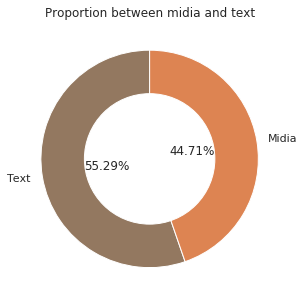

In [25]:
# midia and text
#plt.style.use('default')
#plt.style.use('bmh')
plt.figure(figsize=(5, 5))
plt.title('Proportion between midia and text')
x = [len(df[df['midia']==0]),len(df[df['midia']==1])]
names = ['Text','Midia']
my_circle=plt.Circle( (0,0), 0.6, color='white')
plt.pie(x, labels=names,autopct='%1.2f%%',startangle=90, pctdistance=0.4, colors = ['C5','C1'])
p=plt.gcf()
p.gca().add_artist(my_circle)
plt.show()

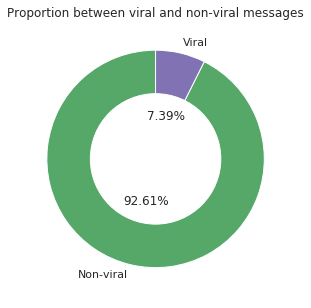

In [26]:
#sharings
#plt.style.use('bmh')
plt.figure(figsize=(5, 5))
plt.title('Proportion between viral and non-viral messages')
x = [len(df[df['viral']==0]),len(df[df['viral']==1])]
names = ['Non-viral','Viral']
my_circle=plt.Circle( (0,0), 0.6, color='white')
plt.pie(x, labels=names,autopct='%1.2f%%',startangle=90, pctdistance=0.4, colors = ['C2','C4'])
p=plt.gcf()
p.gca().add_artist(my_circle)
plt.show()

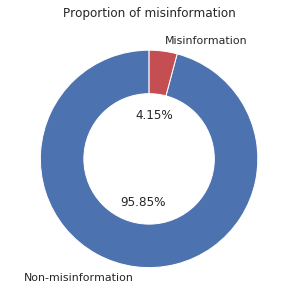

In [27]:
#misinformation
#plt.style.use('bmh')
plt.figure(figsize=(5, 5))
plt.title('Proportion of misinformation')
x = [len(df[df['misinformation']==0]),len(df[df['misinformation']==1])]
names = ['Non-misinformation','Misinformation']
my_circle=plt.Circle( (0,0), 0.6, color='white')
plt.pie(x, labels=names,autopct='%1.2f%%',startangle=90, pctdistance=0.4, colors = ['C0','C3'])
p=plt.gcf()
p.gca().add_artist(my_circle)
plt.show()

# Misinformation statistics

In [28]:
# samples
print('misinformation\n')
m_list = (list(df[df['misinformation']==1]['text'].sample(n=3, random_state=42)))
for m in m_list:
    print(m)
    print('******')
print()

print('non-misinformation\n')
m_list = (list(df[(df['misinformation']==0) & (df['midia']==0)]['text'].sample(n=3, random_state=42)))
for m in m_list:
    print(m)
    print()
print()

misinformation

_*TSE informa:*_ 7,2 milhões de votos anulados pelas urnas! A diferença de votos que levaria à vitória de Bolsonaro no primeiro turno foi de menos de 2 milhões .
O TSE tem obrigação de esclarecer os motivos que levaram à anulação de mais de 7,2 milhões de votos que representam 6,2% do total. A anulação só pode acontecer em voto de papel, porque permite rasuras ou ambiguidade.

Se você enviar para apenas 20 contatos em um minuto, o Brasil inteiro vai desmascarar este Bandido. NÃO quebre essa corrente. Os incautos precisam ser esclarecidos antes que seja tarde demais...
******
ABSURDO! 😡😡😡
UMA PROFESSORA SEGURA O MENINO E OUTRA PASSA O BATOM, 
O MENINO CHORA E IMPLORA PRA NÃO PASSAR , ELAS DEBOCHAM E DÃO RISADA.
ISSO É IDEOLOGIA DE GÊNERO ? 
COMPARTILHE SE NÃO QUER ESSE ABUSO COM NOSSAS CRIANÇAS !
******
Olha o que o candidato à reeleição ao Senado Federal, que foi do PT, PDT e hoje está no  PPS, ( todos partidos de Esquerda), CRISTOVAM BUARQUE fez dentro da casa do povo!

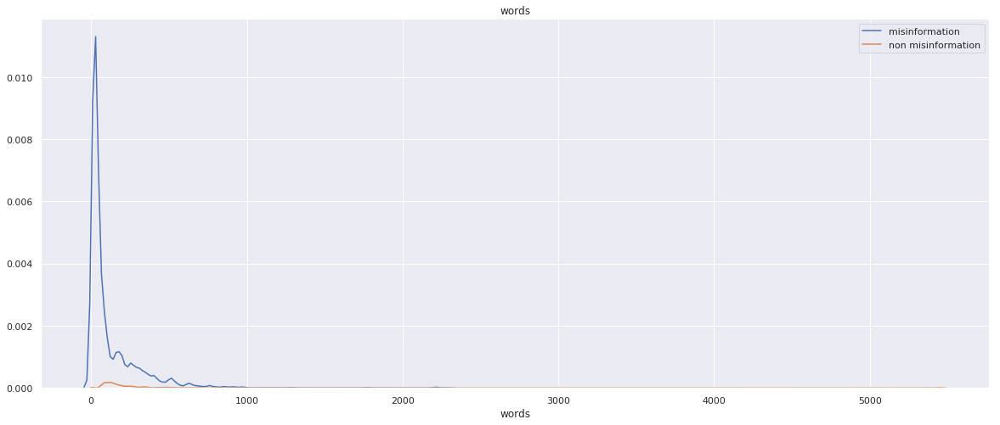

In [29]:
plt.figure(figsize=(20, 8))
plt.title('words')
sns.distplot(df[(df['midia'] == 0) & (df['misinformation'] == 1)]['words'], hist = False, kde = True, label = 'misinformation')
sns.distplot(df[(df['midia'] == 0) & (df['misinformation'] == 0)]['words'], hist = False, kde = True, label = 'non misinformation')
plt.show()

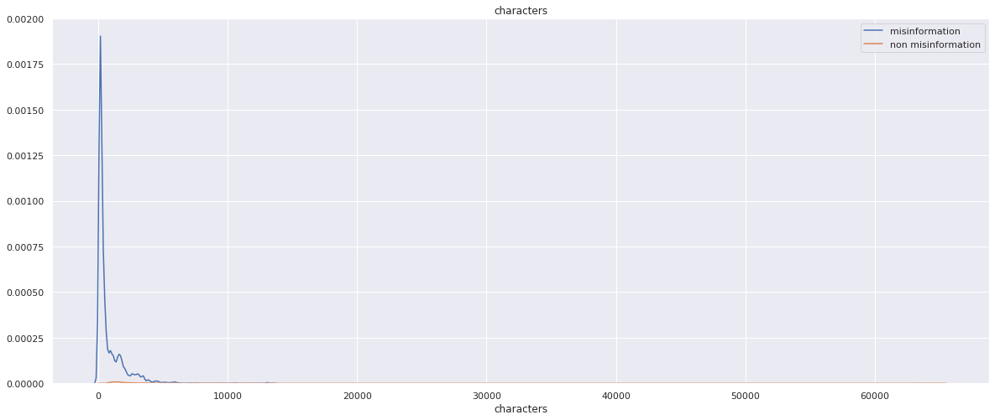

In [30]:
plt.figure(figsize=(20, 8))
plt.title('characters')
sns.distplot(df[(df['midia'] == 0) & (df['misinformation'] == 1)]['characters'], hist = False, kde = True, label = 'misinformation')
sns.distplot(df[(df['midia'] == 0) & (df['misinformation'] == 0)]['characters'], hist = False, kde = True, label = 'non misinformation')
plt.show()

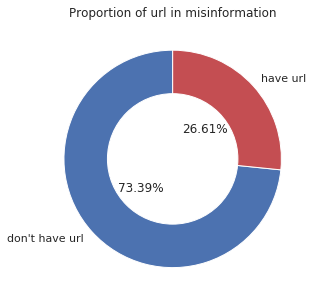

In [31]:
plt.figure(figsize=(5, 5))
plt.title('Proportion of url in misinformation')

not_url = len(df[(df['url']==0) & (df['misinformation']==1)])
url = len(df[(df['url']==1) & (df['misinformation']==1)])
x = [not_url,url]
names = ['don\'t have url','have url']
my_circle=plt.Circle( (0,0), 0.6, color='white')
plt.pie(x, labels=names,autopct='%1.2f%%',startangle=90, pctdistance=0.4, colors = ['C0','C3'])
p=plt.gcf()
p.gca().add_artist(my_circle)
plt.show()

# Geographic data

In [32]:
#plt.style.use('default')
df_br_states = df[(df['state'] != '?') & (df['state'] != 'Estrangeiro') ]
counts = df_br_states.groupby(by='state').count()['id'].sort_index(ascending=False)
non_mis_counts = df_br_states[df_br_states['misinformation'] == 0].groupby(by='state').count()['id'].sort_index(ascending=False) 
misinformations_counts = df_br_states[df_br_states['misinformation'] == 1].groupby(by='state').count()['id'].sort_index(ascending=False) 
states = list(counts.index)
ratio = np.true_divide(misinformations_counts.values,counts.values)
mis_by_state = pd.DataFrame({'state':states,
                             'total messages':counts.values,
                             'non-misinformation':non_mis_counts,
                             'misinformation':misinformations_counts,
                             'ratio':ratio})
#mis_by_state.reset_index(level=None, drop=False, inplace=True, col_level=0, col_fill='')
mis_by_state

,state,total messages,non-misinformation,misinformation,ratio
state,,,,,
Tocantins,Tocantins,40217,37759,2458,0.061118
São Paulo,São Paulo,43955,42351,1604,0.036492
Sergipe,Sergipe,3200,3089,111,0.034688
Santa Catarina,Santa Catarina,11950,11452,498,0.041674
Roraima,Roraima,622,601,21,0.033762
Rondônia,Rondônia,1230,1195,35,0.028455
Rio de Janeiro,Rio de Janeiro,20758,19914,844,0.040659
Rio Grande do Sul,Rio Grande do Sul,3928,3771,157,0.039969
Rio Grande do Norte,Rio Grande do Norte,3568,3442,126,0.035314


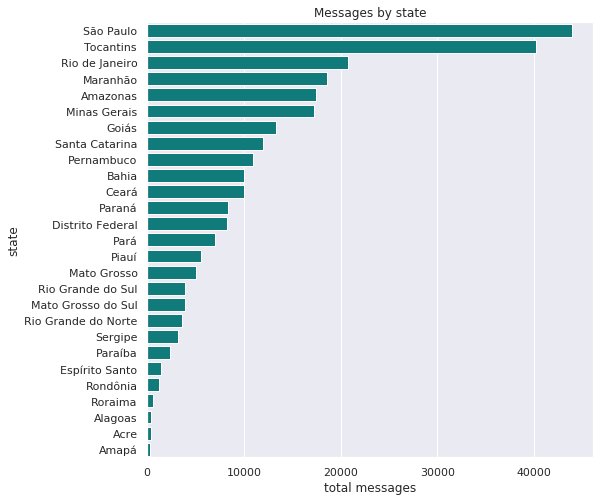

In [33]:
mis_by_state = mis_by_state.sort_values(by = 'total messages', ascending = False)
plt.figure(figsize=(8, 8))
plt.title('Messages by state')
sns.barplot(y='state',x='total messages', data = mis_by_state, color = 'darkcyan')
plt.show()

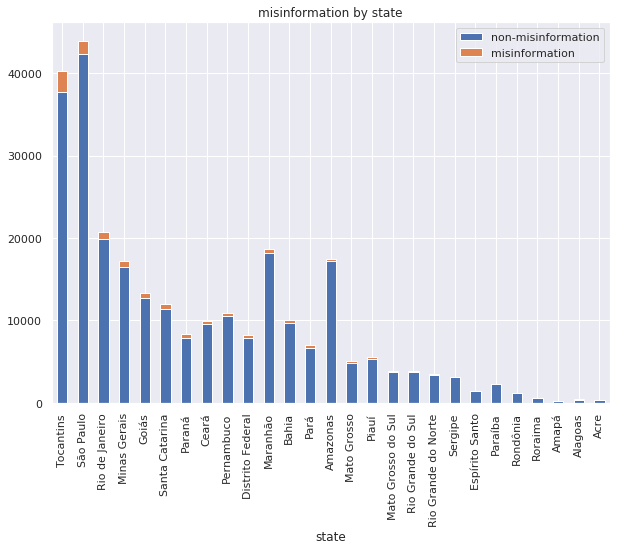

In [34]:
t = 'misinformation by state'
mis_by_state = mis_by_state.sort_values(by = 'misinformation', ascending = False)
mis_by_state.loc[:,['non-misinformation', 'misinformation']].plot.bar(stacked=True, figsize=(10,7),title = t)

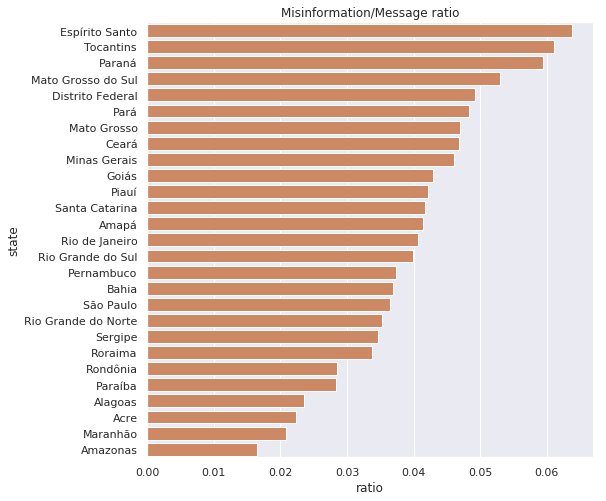

In [35]:
mis_by_state = mis_by_state.sort_values(by = 'ratio', ascending = False)
plt.figure(figsize=(8, 8))
plt.title('Misinformation/Message ratio')
sns.barplot(y='state', x ='ratio', data = mis_by_state, color = 'C1')
plt.show()

### Maps

In [36]:
geobr = 'https://raw.githubusercontent.com/codeforamerica/click_that_hood/master/public/data/brazil-states.geojson'
with urlopen(geobr) as response:
    geo_states = json.load(response)

In [37]:
#messages
fig = px.choropleth(mis_by_state, geojson = geo_states, locations='state',featureidkey="properties.name",
                           color='total messages',
                           color_continuous_scale="blues",
                           #range_color=(0, 0.07),
                           scope="south america",
                           labels={'ratio':'misinformation/message ratio'}
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.write_html("plots/"+str(base)+"/map_messages_br_states.html")

if show:
    fig.show()

In [38]:
#ratio
fig = px.choropleth(mis_by_state, geojson = geo_states, locations='state',featureidkey="properties.name",
                           color='ratio',
                           color_continuous_scale="oranges",
                           range_color=(0, 0.07),
                           scope="south america",
                           labels={'ratio':'misinformation/message ratio'}
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.write_html("plots/"+str(base)+"/map_ratio_br_states.html")
if show:
    fig.show()

## Other countries

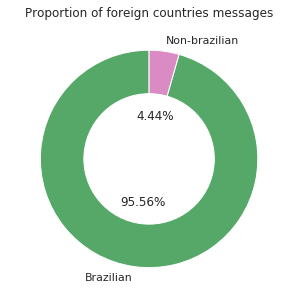

In [39]:
#misinformation
#plt.style.use('bmh')
plt.figure(figsize=(5, 5))
plt.title('Proportion of foreign countries messages')
x = [len(df[df['country']=='BRASIL']),len(df[df['country']!='BRASIL'])]
names = ['Brazilian','Non-brazilian']
my_circle=plt.Circle( (0,0), 0.6, color='white')
plt.pie(x, labels=names,autopct='%1.2f%%',startangle=90, pctdistance=0.4, colors = ['C2','C6'])
p=plt.gcf()
p.gca().add_artist(my_circle)
plt.show()

In [40]:
#plt.style.use('default')
df_foreign = df[(df['state'] == 'Estrangeiro')]
counts = df_foreign.groupby(by='country').count()['id'].sort_index(ascending=False)
non_mis_counts = df_foreign[df_foreign['misinformation'] == 0].groupby(by='country').count()['id'].sort_index(ascending=False) 

misinformations_counts = df_foreign[df_foreign['misinformation'] == 1].groupby(by='country').count()['id'].sort_index(ascending=False) 
mis_dict = dict(misinformations_counts)
mis_keys = list(non_mis_counts.index)
mis_values = [mis_dict.get(m,0) for m in mis_keys]
mis_dict = dict(zip(mis_keys,mis_values))
misinformations_counts = pd.Series(mis_dict)

country2ISO3 = {
    'ESTADOS UNIDOS':'USA',
    'PORTUGAL':'PRT',
    'BRASIL':'BRA',
    'PAQUISTÃO':'PAK',
    'PARAGUAI':'PRY',
    'ESPANHA':'ESP',
    'ITÁLIA':'ITA',
    'ILHA DE MAN':'IMN',
    'ALEMANHA':'DEU',
    'SURINAME':'SUR',
    'VENEZUELA':'VEN',
    'FRANÇA':'FRA',
    'ILHAS COCOS (KEELING)':'CCK',
    'BOLÍVIA':'BOL',
    'ANGOLA':'AGO',
    'ARGENTINA':'ARG',
    'MARROCOS':'MAR',
    'RÚSSIA':'RUS',
    'NOVA ZELANDIA':'NZL',
    'ÍNDIA':'IND',
    'ÁFRICA DO SUL':'ZAF',
    'IÊMEN':'YEM',
    'EGITO':'EGY',
    'TURQUIA':'TUR',
    'MOÇAMBIQUE':'MOZ',
    'GUIANA':'GUY',
    'BENIM':'BEN',
    'COLÔMBIA':'COL',
    'BÉLGICA':'BEL',
    'PERU':'PER',
    'NORUEGA':'NOR',
    'ARÁBIA SAUDITA':'SAU',
    'SUIÇA':'CHE',
    'GANA':'GHA',
    'MÉXICO':'MEX',
    'CHILE':'CHL',
    'SÃO TOMÉ E PRÍNCIPE':'STP',
    'JAPÃO':'JPN',
    'IRÃ':'IRN',
    'INDONÉSIA':'IDN',
    'GUATEMALA':'GTM',
    'PAÍSES BAIXOS':'NLD',
    'SRI LANKA':'LKA',
    'EQUADOR':'ECU',
    'CABO VERDE':'CPV',
    'URUGUAI':'URY',
    'SUÉCIA':'SWE'
}
country = list(counts.index)
iso3 = [country2ISO3[c] for c in country]

ratio = np.true_divide(misinformations_counts.values, counts.values)
mis_by_country = pd.DataFrame({'country':country,
                             'iso3': iso3, 
                             'total messages':counts.values,
                             'non-misinformation':non_mis_counts,
                             'misinformation':misinformations_counts,
                             'ratio':ratio})
mis_by_country = mis_by_country.sort_values(by= 'total messages', ascending = False)
mis_by_country

,country,iso3,total messages,non-misinformation,misinformation,ratio
country,,,,,,
ESTADOS UNIDOS,ESTADOS UNIDOS,USA,1287,1230,57,0.044289
PARAGUAI,PARAGUAI,PRY,255,254,1,0.003922
PORTUGAL,PORTUGAL,PRT,228,210,18,0.078947
FRANÇA,FRANÇA,FRA,141,141,0,0.000000
BOLÍVIA,BOLÍVIA,BOL,92,91,1,0.010870
ESPANHA,ESPANHA,ESP,81,79,2,0.024691
NOVA ZELANDIA,NOVA ZELANDIA,NZL,61,60,1,0.016393
ITÁLIA,ITÁLIA,ITA,45,39,6,0.133333
ILHAS COCOS (KEELING),ILHAS COCOS (KEELING),CCK,32,31,1,0.031250


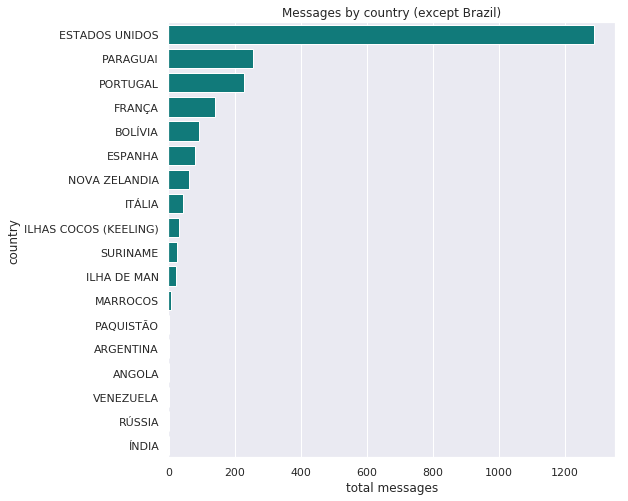

In [41]:
plt.figure(figsize=(8, 8))
plt.title('Messages by country (except Brazil)')
sns.barplot(y='country',x='total messages', data = mis_by_country, color = 'darkcyan')
plt.show()

In [42]:
geo = 'https://raw.githubusercontent.com/datasets/geo-countries/master/data/countries.geojson'
with urlopen(geo) as response:
    geo_world = json.load(response)

In [43]:
geo_world['features'][0]['properties']

{'ADMIN': 'Aruba', 'ISO_A3': 'ABW', 'ISO_A2': 'AW'}

In [44]:
#total messages
fig = px.choropleth(mis_by_country, geojson = geo_world, locations='iso3',featureidkey="properties.ISO_A3",
                           color='total messages',
                           color_continuous_scale="algae",
                           #range_color=(0, 14),
                           #scope="south america",
                           labels={'total messages':'total messages'}
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.write_html("plots/"+str(base)+"/map_messages_world.html")
if show:
    fig.show()

# Time series analysis

In [45]:
def custom_time(data,hora):
    string = data + " " + hora
    return string
df['timestamp'] = df.apply(lambda x: custom_time(x['date'],x['hour']),axis=1)

In [46]:
df['timestamp'] = pd.to_datetime(df['timestamp'], format='%d/%m/%y %H:%M')
timeseries = df.groupby('timestamp').count()['id']
#timeseries = timeseries.sort_index()
fig = px.line(x=timeseries.index, y=timeseries.values, title = 'Timeseries visualization')
fig.show()

In [47]:
df['date'] = pd.to_datetime(df['date'], format='%d/%m/%y')
timeseries = df.groupby('date').count()['id']
timeseries = timeseries.sort_index()
fig = px.line(x=timeseries.index, y=timeseries.values, title = 'Timeseries visualization by day')
fig.show()

In [48]:
df['hour'] = pd.to_datetime(df['hour'], format = '%H:%M' )
timeseries = df.groupby('hour').count()['id']
timeseries = timeseries.sort_index()
fig = px.line(x=timeseries.index, y=timeseries.values, title = 'Timeseries visualization by hour')
fig.show()

# Distribuitions

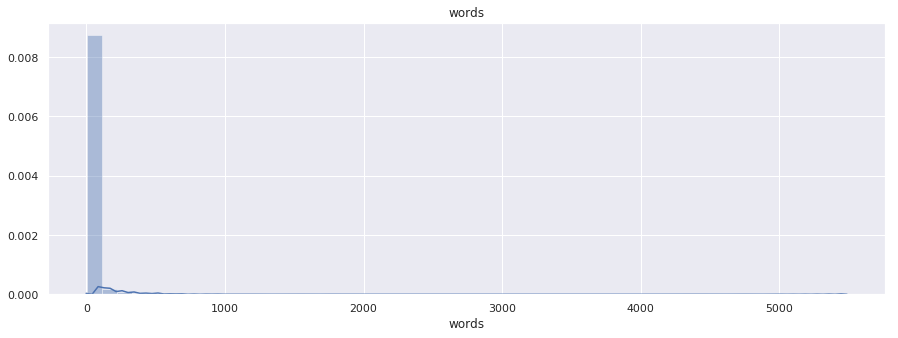

In [49]:
plt.figure(figsize=(15, 5))
plt.title('words')
sns.distplot(df[df['midia'] == 0]['words'], rug = False, kde = True)
plt.show()

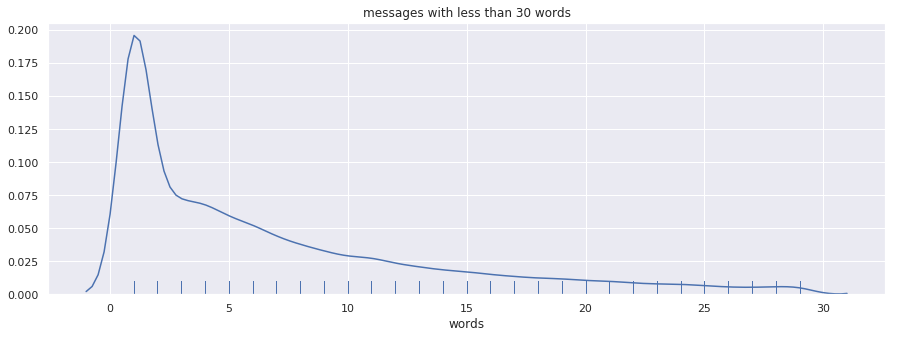

In [50]:
plt.figure(figsize=(15, 5))
plt.title('messages with less than 30 words')
sns.distplot(df[(df['midia'] == 0) & (df['words'] < 30)]['words'], hist = False, rug = True, kde = True)
#plt.show()

In [51]:
# Distribuition name??

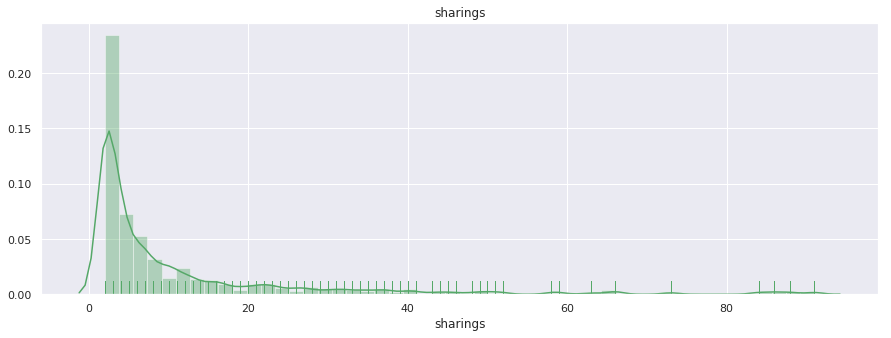

In [52]:
plt.figure(figsize=(15, 5))
plt.title('sharings')
sns.distplot(df[df['sharings'] > 1]['sharings'], rug = True, kde = True, color = 'C2')
plt.show()

# Most active users

In [53]:
df['text'] = [str(m) for m in df['text']]

def getUserData(df,users):
    '''
    Creates a DataFrame with most active users information
    Input: DataFrame with all data, number of users desired
    Output: DataFrame with number of messages, number of texts, number of midia files, ddd, ddi, state, country and all texts
    '''
    texto = []
    midia = []
    pais = []
    estado = []
    ddd = []
    ddi = []
    msg_str = []
    for user in users.index:
        texto.append(len(df[(df['id'] == user) & (df['midia']==0)]))
        midia.append(len(df[(df['id'] == user)]) - len(df[(df['id'] == user) & (df['midia']==0)]))
        pais.append(df[df['id']==user].iloc[0]['country'])
        estado.append(df[df['id']==user].iloc[0]['state'])
        ddd.append(df[df['id']==user].iloc[0]['ddd'])
        ddi.append(df[df['id']==user].iloc[0]['ddi'])
        msgs = df[(df['id']==user) & (df['midia']==0)]['text']
        msgs = list(msgs.values)
        msgs = " <-> ".join(msgs)
        msg_str.append(msgs)
        
    topUsers = pd.DataFrame({'id':user, 'count messsages':users.values, 
                             'texts':texto, 'midia':midia,
                             'ddi':ddi,'ddd':ddd,'country':pais,
                             'state':estado,'messages':msg_str})    
    return topUsers
    

def getTopUsers(df,top=20):
    groupedByid = df.groupby(['id']).count()
    groupedByid = groupedByid.sort_values('date', ascending=False)[0:top]['date']
    return getUserData(df,groupedByid)

topUsers = getTopUsers(df,10)
topUsers

,id,count messsages,texts,midia,ddi,ddd,country,state,messages
0,3201344459315743060,4396,3742,654,55,11,BRASIL,São Paulo,Ontem eu vi um vídeo de um travesti xingando a...
1,3201344459315743060,2332,972,1360,?,?,?,?,Fazer campanha contraria tbm ajuda <-> É verda...
2,3201344459315743060,2064,948,1116,55,67,BRASIL,Mato Grosso do Sul,Kkkk as urnas que são fraudadas kkkk essa desc...
3,3201344459315743060,2020,1587,433,55,63,BRASIL,Tocantins,"*Ordem em meio a caos, o sucesso das escolas m..."
4,3201344459315743060,1810,828,982,55,31,BRASIL,Minas Gerais,Para bom entendedor meia palavra basta.\nNo ge...
5,3201344459315743060,1584,466,1118,55,14,BRASIL,São Paulo,Motor elétrico trifásico de 96 volts e 71 cava...
6,3201344459315743060,1271,388,883,55,61,BRASIL,Distrito Federal,Liturgia Diária\nVoltar\nQuer ver a Liturgia d...
7,3201344459315743060,1172,994,178,55,99,BRASIL,Maranhão,Cara <-> Assisto os vídeos do Eneas hj em dia ...
8,3201344459315743060,1166,284,882,55,91,BRASIL,Pará,Olha aí Representantes de ONGs ensinando os ve...
9,3201344459315743060,1126,950,176,55,92,BRASIL,Amazonas,Boa noite caros amigos! <-> 🤝🏼 <-> Seja bem vi...


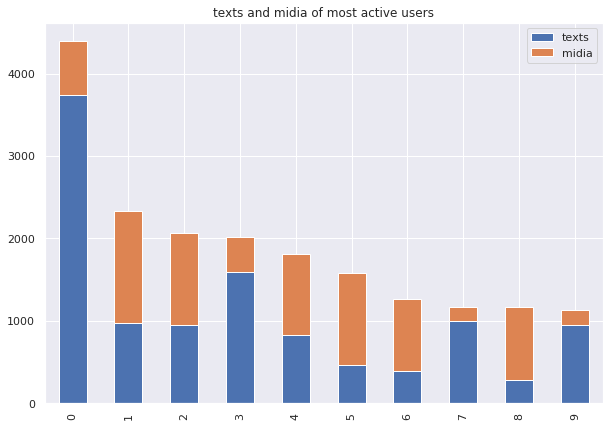

In [54]:
t = 'texts and midia of most active users'
topUsers.loc[:,['texts', 'midia']].plot.bar(stacked=True, figsize=(10,7),title= t)
plt.show()

# Users that shared more midia
Possible bot activity

In [55]:
def getTopMidiaUsers(df,top=20):
    groupedByID = df[df['midia']==1].groupby(['id']).count()
    groupedByID = groupedByID.sort_values('date', ascending=False)[0:top]['date']
    return getUserData(df,groupedByID)

topMidia = getTopMidiaUsers(df,10)
topMidia

,id,count messsages,texts,midia,ddi,ddd,country,state,messages
0,-7481691239712874829,1360,972,1360,?,?,?,?,Fazer campanha contraria tbm ajuda <-> É verda...
1,-7481691239712874829,1118,466,1118,55,14,BRASIL,São Paulo,Motor elétrico trifásico de 96 volts e 71 cava...
2,-7481691239712874829,1116,948,1116,55,67,BRASIL,Mato Grosso do Sul,Kkkk as urnas que são fraudadas kkkk essa desc...
3,-7481691239712874829,982,828,982,55,31,BRASIL,Minas Gerais,Para bom entendedor meia palavra basta.\nNo ge...
4,-7481691239712874829,883,388,883,55,61,BRASIL,Distrito Federal,Liturgia Diária\nVoltar\nQuer ver a Liturgia d...
5,-7481691239712874829,882,284,882,55,91,BRASIL,Pará,Olha aí Representantes de ONGs ensinando os ve...
6,-7481691239712874829,741,279,741,55,31,BRASIL,Minas Gerais,Acabou de explodir o gasômetro da Usiminas <->...
7,-7481691239712874829,683,272,683,55,63,BRASIL,Tocantins,"Bolsonaro já está eleito nos EUA, e o primeiro..."
8,-7481691239712874829,654,3742,654,55,11,BRASIL,São Paulo,Ontem eu vi um vídeo de um travesti xingando a...
9,-7481691239712874829,556,515,556,55,18,BRASIL,São Paulo,👏🏼👏🏼👏🏼😎😂 <-> 💪👊🏼🤜👊🏼😎😎😂😂 <-> https://sajjasite....


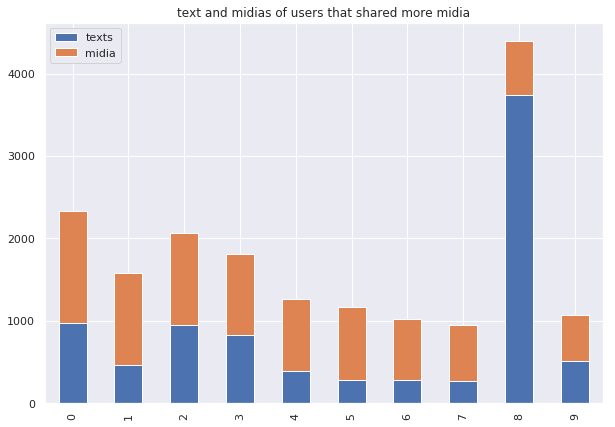

In [56]:
t = 'text and midias of users that shared more midia'
topMidia.loc[:,['texts', 'midia']].plot.bar(stacked=True, figsize=(10,7),title= t)
plt.show()

# Messages more shared in different groups

In [57]:
#df = df.groupby('domain')['ID'].nunique()
msg_group = df[df['viral']==1][['text','group']]
msg_group = msg_group.groupby('text')['group'].nunique()
msg_group = msg_group.sort_values(ascending=False)
topMsgs = msg_group[0:10]
topMsgs = topMsgs.to_frame()
topMsgs

,group
text,
"_*TSE informa:*_ 7,2 milhões de votos anulados pelas urnas! A diferença de votos que levaria à vitória de Bolsonaro no primeiro turno foi de menos de 2 milhões .\nO TSE tem obrigação de esclarecer os motivos que levaram à anulação de mais de 7,2 milhões de votos que representam 6,2% do total. A anulação só pode acontecer em voto de papel, porque permite rasuras ou ambiguidade.\n\nSe você enviar para apenas 20 contatos em um minuto, o Brasil inteiro vai desmascarar este Bandido. NÃO quebre essa corrente. Os incautos precisam ser esclarecidos antes que seja tarde demais...",34
"Sem palavras, só divulgue para seus contatos e peçam para que todos façam o mesmo simultaneamente e daqui um minuto está mensagem estará nos quatros cantos da terra.",34
"Vamos fazer campanha inteligente e garantir a vitória!?\n- Não compartilhem nada ofensivo ao Nordeste!!! 2014 internet bombou de ofensas e a Dilma cresceu absurdamente la no segundo turno!\n- Compartilhe mensagens positivas dele e da mudança!\n- Guarde pra VC o medo, transmita confiança para cativar votos!\n- Respeite a opinião alheia!\n- Cheque a Notícia, Fake News joga contra!\nEleição tem dois turnos essa é a regra do jogo! AGORA É A HORA!",32
"Vamos dar ""dislike"" nos vídeos dos artistas ""rouanet's"" ""EleNão""\nClica no link, vai aparecer o vídeo e vc clica na mãozinha 👎🏼. A diferença do 👎🏼 para o 👍🏼 é gigantesca.\n\nAnitta\nhttps://youtu.be/QmrnZobpyW8\n\nDaniella Mercury\nhttps://youtu.be/GlrKJBfiXcI\n\nLetícia Sabatella\nhttps://youtu.be/83Z0ZxqJvPA\n\nLetícia Colin\nhttps://youtu.be/gtj9Ylc3Chc\n\nMarília Mendonça \nhttps://youtu.be/jQGtJq3yZh0\n\nClipe ""EleNão""\nhttps://youtu.be/SBBVS84oYP8",30
Enquete para presidência! *Quem é seu candidato?* Vote e veja quem esta ganhando as Eleições 2018 *Acesse* ⤵\nhttps://pesquisaeleitoral2018.online/eleitoral/2018/,29
"Golpe, Golpe, Golpe... Adelio foi autorizado a dar entrevista dia 5 sexta-feira depois q acabar o horário eleitoral. Fontes confiáveis e dignas viram os textos. Ele vai dizer q foi o próprio partido de Bolsonaro q armou tudo. Vai contar todos os detalhes. Não acreditem meus irmãos será a última cartada nojenta, nazista dessa gentalha vermes vermelhos. A TV vai ficar comentando na sexta a noite, sábado e domingo, quando Bolsonaro não terá mais como se defender. TEMOS Q PREPARAR TODO MUNDO DESDE AGORA! Passe p todos os amigos e irmãos. Repassem esse texto urgente e aos montes p não pegar ninguém de surpresa. Deus será conosco nessa batalha contra as hostes do inferno.",29
"Nota Oficial :\n\nPessoal aqui quem lhe falam é Eduardo Bolsonaro, candidato a deputado federal.\n\nPessoal este é um recadinho muito rápido, peço a todos que compartilhem com o máximo de pessoas ! Compartilhem em grupos ! Em contatos, nas mídias sociais.\n\nPessoal, amanhã dia 07/10 dia de eleição ! Não compareça a sua seção com camiseta de apoio ao Jair Bolsonaro. \n\nPessoal em todos estes anos de eleição, nunca foi admitido este tipo de manifestação, mesmo silenciosa, é considerado boca de urna, é considerado CRIME !\n\nEstá muito estranho está historinha de poder ir votar com a camiseta do candidato. Isto está nós cheirando golpe, para anular o voto de vocês ! \n\nEntão amanhã não compareçam com a camiseta em apoio ao candidato Jair BOLSONARO, vamos ir de amarelo, camiseta do Brasil, mas por favor, vamos desconfiar de tudo ! Isso está nos gerando golpe no TSE contra a vitória em primeiro turno de Bolsonaro. \n\nEles podem não anular 100% dos votos, mas se eles anularem 15% já perdemos em primeiro turno. \n\nEntão desconfiem de tudo. \n\nAgradeço a todos que compartilharem essa mensagem.\n\nEduardo Bolsonaro,\nBrasil acima de tudo, Deus Acima de Todos.\n\n\n#17",29
Vota aí e repassa!!! Vamos ver se o ibope está certo?\n\n\nhttps://pt.surveymonkey.com/r/W85R38F,28
"Olha só que ideia interessante...\n\nSe formos 75 milhões de filiados ao psl, obrigatoriamente terão que haver no mínimo 75 milhões de votos para Bolsonaro nas urnas...\n\nAí

# Viral messages
Possible misinformation

In [58]:
groupedByMsg = df[(df['midia'] == 0) & (df['text'] != 'Aguardando esta mensagem') & 
                  (df['text'] != 'Mensagem incompatível') & 
                  (df['text'] != 'Esta mensagem foi apagada') & (df['text'] != 'nan') & 
                  (df['words'] > 3)].groupby(['text']).count()
groupedByMsg = groupedByMsg.sort_values('date', ascending=False)['id']
groupedByMsg = pd.DataFrame(groupedByMsg)
groupedByMsg = groupedByMsg.rename(columns={'id':'count'})
groupedByMsg = groupedByMsg[groupedByMsg['count'] > 1]
groupedByMsg[0:10]

,count
text,
"_*TSE informa:*_ 7,2 milhões de votos anulados pelas urnas! A diferença de votos que levaria à vitória de Bolsonaro no primeiro turno foi de menos de 2 milhões .\nO TSE tem obrigação de esclarecer os motivos que levaram à anulação de mais de 7,2 milhões de votos que representam 6,2% do total. A anulação só pode acontecer em voto de papel, porque permite rasuras ou ambiguidade.\n\nSe você enviar para apenas 20 contatos em um minuto, o Brasil inteiro vai desmascarar este Bandido. NÃO quebre essa corrente. Os incautos precisam ser esclarecidos antes que seja tarde demais...",91
"Sem palavras, só divulgue para seus contatos e peçam para que todos façam o mesmo simultaneamente e daqui um minuto está mensagem estará nos quatros cantos da terra.",88
"Vamos fazer campanha inteligente e garantir a vitória!?\n- Não compartilhem nada ofensivo ao Nordeste!!! 2014 internet bombou de ofensas e a Dilma cresceu absurdamente la no segundo turno!\n- Compartilhe mensagens positivas dele e da mudança!\n- Guarde pra VC o medo, transmita confiança para cativar votos!\n- Respeite a opinião alheia!\n- Cheque a Notícia, Fake News joga contra!\nEleição tem dois turnos essa é a regra do jogo! AGORA É A HORA!",86
Enquete para presidência! *Quem é seu candidato?* Vote e veja quem esta ganhando as Eleições 2018 *Acesse* ⤵\nhttps://pesquisaeleitoral2018.online/eleitoral/2018/,84
"Vamos dar ""dislike"" nos vídeos dos artistas ""rouanet's"" ""EleNão""\nClica no link, vai aparecer o vídeo e vc clica na mãozinha 👎🏼. A diferença do 👎🏼 para o 👍🏼 é gigantesca.\n\nAnitta\nhttps://youtu.be/QmrnZobpyW8\n\nDaniella Mercury\nhttps://youtu.be/GlrKJBfiXcI\n\nLetícia Sabatella\nhttps://youtu.be/83Z0ZxqJvPA\n\nLetícia Colin\nhttps://youtu.be/gtj9Ylc3Chc\n\nMarília Mendonça \nhttps://youtu.be/jQGtJq3yZh0\n\nClipe ""EleNão""\nhttps://youtu.be/SBBVS84oYP8",73
Vota aí e repassa!!! Vamos ver se o ibope está certo?\n\n\nhttps://pt.surveymonkey.com/r/W85R38F,66
"Você foi selecionado para participar da *Nova pesquisa eleitoral* da _DATAFOLHA_, *responda* no link a seguir: http://datafolha.pesquisabr.site\nSua opinião é muito importante para o Brasil.",66
"Nota Oficial :\n\nPessoal aqui quem lhe falam é Eduardo Bolsonaro, candidato a deputado federal.\n\nPessoal este é um recadinho muito rápido, peço a todos que compartilhem com o máximo de pessoas ! Compartilhem em grupos ! Em contatos, nas mídias sociais.\n\nPessoal, amanhã dia 07/10 dia de eleição ! Não compareça a sua seção com camiseta de apoio ao Jair Bolsonaro. \n\nPessoal em todos estes anos de eleição, nunca foi admitido este tipo de manifestação, mesmo silenciosa, é considerado boca de urna, é considerado CRIME !\n\nEstá muito estranho está historinha de poder ir votar com a camiseta do candidato. Isto está nós cheirando golpe, para anular o voto de vocês ! \n\nEntão amanhã não compareçam com a camiseta em apoio ao candidato Jair BOLSONARO, vamos ir de amarelo, camiseta do Brasil, mas por favor, vamos desconfiar de tudo ! Isso está nos gerando golpe no TSE contra a vitória em primeiro turno de Bolsonaro. \n\nEles podem não anular 100% dos votos, mas se eles anularem 15% já perdemos em primeiro turno. \n\nEntão desconfiem de tudo. \n\nAgradeço a todos que compartilharem essa mensagem.\n\nEduardo Bolsonaro,\nBrasil acima de tudo, Deus Acima de Todos.\n\n\n#17",63
"Olha só que ideia interessante...\n\nSe formos 75 milhões de filiados ao psl, obrigatoriamente terão que haver no mínimo 75 milhões de votos para Bolsonaro nas urnas...\n\nAí não tem como fraudar...\n👇👇👇👇👇👇👇\n\n\nGalera estamos em uma campanha massiva de cadastro de filiação no site do PSL, é de graça, pegue seu RG, CPF e Titulo de Eleitor - queremos passar dos 50 milhões de inscritos -, assim poderemos contrapor a fraude do voto contra o TSE, entre no link, faça seu cadastro e divulgue em toda rede social, convoque os demais. 👇😎🙏🇧🇷🇧🇷😎👇Vamos COMPARTILHAR em todas as redes sociais!\n\nhttps://www.pslnacional.org.br/\n\nPrecisamos alcançar 75 milhões d

In [59]:
len(groupedByMsg)

5738

# Identical messages shared by the same user
Possible bot activity

In [60]:
#BOT
#Número de vezes que um mesmo usuário compartilha a mesma mensagem
groupedByMsgAndID = df[(df['midia'] == 0) & (df['characters'] > 10)].groupby(['id','text']).count()
groupedByMsgAndID = pd.DataFrame(groupedByMsgAndID.sort_values('date', ascending=False)['date'])
groupedByMsgAndID = groupedByMsgAndID.rename(columns={'date':'count'})
groupedByMsgAndID[groupedByMsgAndID['count'] > 5][0:10]

,,count
id,text,
-8811763268278453132,"https://www.instagram.com/jairmessiasbolsonaro/\n*Atenção*\n*Nesse momento o nosso candidato está com 1.9 Milhões de seguidores no Instagram,vamos repassar o link do perfil oficial dele para todos os amigos, Familiares e conhecidos que irão votar nele para segui-lo caso não siga aínda*\n\n*Rumo aos 2 Milhões*\n*Repassem essa mensagem em todos os grupos de Direita que vc está*",43
484315296795177283,💪🏻🇧🇷1⃣7⃣🇧🇷👊🏻,27
4281388427488472786,Bom dia para todos!,24
-7649344784600108030,*📍PAGAMENTOS DE BOLETOS COM ATE 50% DE DESCONTO📍*\n\n*📄 PAGAMOS QUALQUER TIPO DE BOLETO QUE TENHA CÓDIGO DE BARRAS📄*\n\n*😱 CLIENTE SO PAGA APOS O ENVIO COMPROVANTE DO SEU PAGAMENTO😱*\n\n*📍 INFORMAÇÕES PV*,24
4305486479648129759,"✅✅ATENÇÃO✅✅\nNesta quarta-feira dia 12/09/2018 *TODOS os apoiadores do BOLSONARO* estão sendo convocados para estarem doando sangue *em todo Brasil*. Faça sua parte e doe, não podemos esquecer que *foi o sangue de um desconhecido Doador que salvou a vida de Jair Bolsonaro.* \n.\n.\n.\nEu farei minha parte com certeza aqui em Palmas do Tocantins.",21
350255697746664146,"Olá me chamo Leonardo tenho 29 anos e sou cuidador de cães. Você que vai viajar e não tem com quem deixar seu cãozinho, não se preocupe!!! Cuidarei muito bem dele!!! Possuo boas referências, e clientes satisfeitos. Seu cãozinho ficara no conforto de sua casa e contara com a minha visita no minimo duas vezes em horário a combinar. Telefone para contato: (63)981079424 (Wathats)\n63 984569001",21
-8346017466820368691,"QUEM TIVER INTERESSE EM PAGA *BOLETOS ,FATURA DE CARTAO DE CRÉDITO, AGUA & LUZ , SKY , OI TV , CLARO TV , AVON,NATURA*, TODOS A 50% DO VALOR VEM PV!!\nVOCE SO PAGA APOS COMPROVANTE DE *PAGAMENTO*\n\n*SOMENTE INTERESSADOS*",17
-9166534760459654877,"https://chat.whatsapp.com/BMWSZuY1UfC6ZuUZkTc92J\n\n 💫😃 1⃣7⃣✨\n\nO mais no grupo de rede Pró-Bolsonaro no Tocantins, chegamos a 46 cidades do interrior do estado. 💚💛\n\nEnvie esse link para todos da região de Monte do Carmo.\n\n🚀🚀🚀🚀🚀🚀🚀🚀",16
5782050016593913959,"🇧🇷🇧🇷🇧🇷🇧🇷🇧🇷🇧🇷🇧🇷🇧🇷\n *_Sejam bem vindos!!!*_ \nSegue as regras do grupo para não ter problemas com os ADMs.\n\n *1° ❌❌❌❌PROIBIDO* \nqualquer tipo de postagens relacionadas a pornografia. *(Remoção imediata sem aviso prévio).* \n\n *2° ❌❌ PROIBIDO* postagens que não seja relacionados aos assuntos de interesse do grupo. Ex: postagens de piadas, futebol, filmes, novelas etc... *SALVO* se for informativo que tem ligação com caso de política ou polícia. *(Será informado 1° vez no próprio grupo e estará em observação e será removido se postar a 2° vez)* \n\n *3° ❌ PROIBIDO* qualquer tipo de postagens de discriminação. Ex: relacionados a raça, etnia, crença e religião etc...(principalmente a cristã) *SALVO* se é informativo que esteja acontecendo esse tipo descriminação em algum lugar ou informando que haja algo irregular nesses aspectos. *(Remoção segue a mesma regra n° 2)* \n\n *4° ❌PROIBIDO* pedir adm. Se você estiver no grupo já bastante tempo e estiver postando informações relacionadas em ajudar o grupo, ganhará a confiança e automaticamente o ADM.\n\n *5°* ❌❌❌❌ *PROIBIDO* desrespeitar qualquer integrante do grupo, principalmente os ADMs, pois estamos aqui com o objetivo de informar a todos. *(Remoção imediata).* \n \n\n *PERMISSÕES DE POSTAGENS* \n\n✅ Postagens de bom dia.\n\n✅Postagens de incentiva de vida (motivacional).\n \n✅ Postagens de polícia ou relacionadas.\n\n✅Postagens de religião.(TODAS)\n\n✅Postagens de qualquer assunto que tem o objetivo de informar os integrantes.\n *SALVO* se infringir as regras de proibições.\n\n✅✅✅✅ Postagens de política.\n\n✅✅Postagens de piadas relacionadas a politica e policia. *SALVO* se denegrir a imagem de Bolsonaro e qualquer tipo de força nacional de segurança.\n\n✅✅ Postagens de links de outros grupos de políticas pois o nosso objetivo é deixar os brasileiros mais interessados nesse assuntos. \n\n✅✅✅✅✅✅ Postagens relacionadas ao *JAIR MESSIAS BOLSONARO* . (Esse é o principal 

# Identical messages shared by the same user in more than one group
Possible bot activity

In [61]:
#BOT
#Número grupos nos quais foram compartilhadas mensagens idênticas
filtering = df[(df['midia'] == 0)]
nUniqueGroupsGroupedByMsgAndID = filtering.groupby(['id','text']).nunique()
nUniqueGroupsGroupedByMsgAndID = pd.DataFrame(nUniqueGroupsGroupedByMsgAndID.sort_values('group', ascending=False)['group'])
nUniqueGroupsGroupedByMsgAndID = nUniqueGroupsGroupedByMsgAndID.rename(columns={'group':'count of groups'})
nUniqueGroupsGroupedByMsgAndID[nUniqueGroupsGroupedByMsgAndID['count of groups'] > 1][0:10]

count of groups
id                   text                                                               
-8811763268278453132 https://www.instagram.com/jairmessiasbolsonaro/...                9
-4841082009873797706 Deus! abençoe a todos e dê sabedoria para que p...                9
-9166534760459654877 Ato cívico em apoio a valores militares é reali...                8
                     https://youtu.be/nW0q7MYsjPk\n\nVídeo da coorde...                8
-8811763268278453132 https://www.instagram.com/jairmessiasbolsonaro/...                8
-4841082009873797706 Queremos agradecer imensamente a todos que nos ...                8
-9166534760459654877 http://araguainanoticias.com.br/noticia/50063/g...                7
                     https://youtu.be/iUALuIb3TrE\n\n         Ato Na...                7
                     https://youtu.be/lJGjBhvW3tU\n\nFoi agora as 9 ...                7
                     Presidente: Bolsonaro 1⃣7⃣\n\n👀 Veja se sua cid...                7

# Most shared URLs

In [62]:
def getURL(texts):
    '''
    Extratcs url from list of texts
    Input: list of texts
    Output: list of urls
    '''
    re_url = '[^\s]*https*://[^\s]*'
    urls = []
    
    for t in list(texts):
        matches = re.findall(re_url,t, flags=re.IGNORECASE)
        if matches:
            urls += matches      
            
    return urls

urls_in_text = list(df[df['url']==1]['text'])
    
urls = pd.Series(getURL(urls_in_text))
urls = urls.groupby(by=urls.values).count()
urls = urls.sort_values(ascending=False)
urls[0:10]

https://youtu.be/JVDyowAzBrU                         384
✅https://chat.whatsapp.com/EXuGKOsE0jgHFY5LoOP0dx    257
✅https://chat.whatsapp.com/ABojVsdKjAx1jMgtmttXCq    202
https://youtu.be/GlrKJBfiXcI                         155
https://youtu.be/83Z0ZxqJvPA                         143
https://youtu.be/jQGtJq3yZh0                         137
✅https://chat.whatsapp.com/IgssgURUT9HB6dMVfjOrrX    130
https://youtu.be/QmrnZobpyW8                         129
https://youtu.be/SBBVS84oYP8                         128
https://youtu.be/gtj9Ylc3Chc                         125
dtype: int64

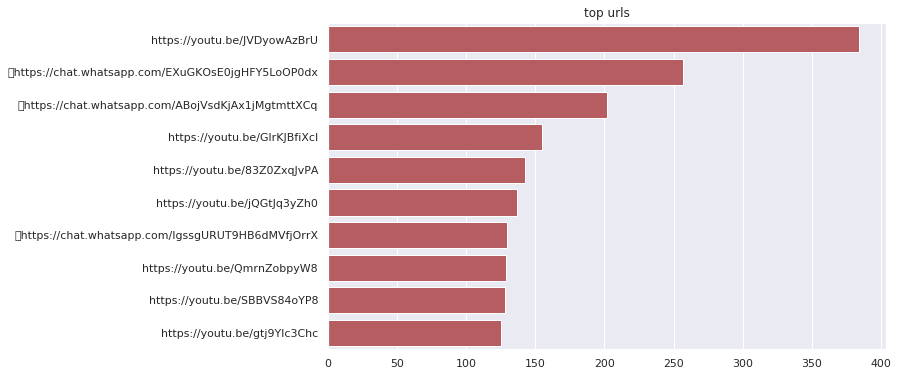

In [63]:
plt.figure(figsize=(10, 6))
plt.title('top urls')
sns.barplot(y=urls[0:10].index,x = urls[0:10].values, color = 'C3')
plt.show()

# Most frequent terms

In [64]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from nltk.corpus import stopwords
stopwords = set(stopwords.words('portuguese'))

new_stopwords = ['aí','pra','vão','vou','onde','lá','aqui',
                 'tá','pode','pois','so','deu','agora','todo',
                 'nao','ja','manda','vc', 'bom', 'dia', 'ai',
                 'kkk','kkkk','ta', 'voce', 'alguem', 'ne', 'pq',
                 'cara','to','mim','la','vcs','tbm', 'tudo']
new_stopwords = set(new_stopwords)
stopwords.update(new_stopwords)

In [65]:
todasMensagens = ' '.join(list(df[(df['midia'] == 0) & (df['words'] > 3) & 
                                  (df['characters'] < 1000) & (df['url'] == 0)]['text']))
#todasMensagens = [str(m.lower()) for m in todasMensagens]

In [66]:
wordcloud = WordCloud(stopwords = stopwords, background_color="white",width = 800, height = 600).generate(todasMensagens)
wordcloud.to_file('plots/'+str(base)+'/wordcloud_all_data.png')

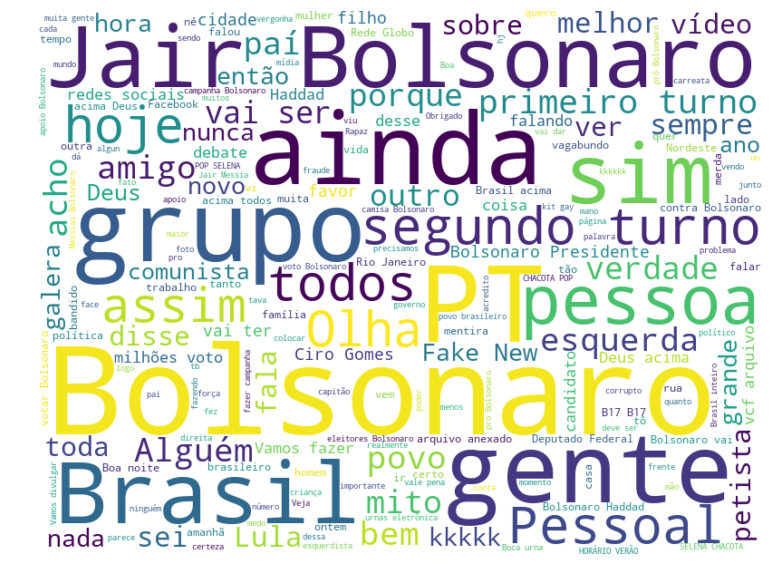

In [67]:
show = True
#plot wordcloud
if show:
    plt.figure(figsize=(15,10))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()

# Queries

In [68]:
def haveWord(word,text):
    word = word.lower()
    text = str(text).lower()
    if word in text:
        return True
    else:
        return False
    
def haveRegex(regex,text):
    matches = re.findall(regex,text)
    if matches:
        return True
    else:
        return False

In [69]:
df_query = df[df.apply(lambda x: haveWord('ptralha',x['text']),axis=1)]
print(len(df_query))
#df_query[0:10]
for m in list(df_query['text'].unique()[0:10]):
    print(m)
    print('***')

82
Mais uma vez o PT deu tiro no pé, veja o que o rapper Mano Brown disse em frente aos PTralhas.
***
ATENÇÃO
Pessoal, estive verificando o que aconteceu no outro grupo.
O número [TELEFONE] é do principal responsável que se infiltrou como administrador. Essa pessoa usa até a imagem a imagem pró Bolsonaro para se infiltrar no grupo.

A ação de excluir os administradores e tomar conta do grupo ocorreu por 4 PTralhas que começaram a remover no mesmo instante.
São eles:
[TELEFONE] (art. 171)
[TELEFONE]
[TELEFONE]
[TELEFONE]
👆🏻Estes foram os principais PTralhas.

Foram adicionados no grupo, principalmente pelo primeiro PTralha 👆🏻os seguintes números também de esquerdopatas:
[TELEFONE]
[TELEFONE]
[TELEFONE]
[TELEFONE]
[TELEFONE]
[TELEFONE]
[TELEFONE]
[TELEFONE] (art.171)
[TELEFONE]
[TELEFONE]
[TELEFONE]
[TELEFONE] (art. 171)
[TELEFONE]
[TELEFONE]
[TELEFONE] (art. 171)
[TELEFONE]
[TELEFONE]
[TELEFONE]
[TELEFONE]
[TELEFONE]
[TELEFONE]
[TELEFONE] (art. 171)
[TELEFONE]
[TELEFONE]
[TELEFONE]
[TEL

In [70]:
# there are some message tagged as misinformation that are not viral?
df[(df['misinformation']==1) & (df['viral']==0)]

,id,date,hour,ddi,country,country_iso3,ddd,state,group,midia,url,characters,words,viral,sharings,text,misinformation,timestamp
121,4080266983443972531,2018-08-24,1900-01-01 17:00:00,55,BRASIL,BRA,17,São Paulo,2018_1,0,0,2311,363,0,1,Há informações fidedignas que o desmoralizado ...,1,2018-08-24 17:00:00
240,-4391661641377612003,2018-09-02,1900-01-01 14:54:00,55,BRASIL,BRA,13,São Paulo,2018_1,0,0,299,50,0,1,Kkkkkk essa acho que nem o Bolsonaro esperava!...,1,2018-09-02 14:54:00
378,2775036360410899212,2018-09-09,1900-01-01 06:28:00,55,BRASIL,BRA,24,Rio de Janeiro,2018_1,0,0,208,34,0,1,Acabou de ser noticiado no *G1*\n😱😱😱\n\nA cand...,1,2018-09-09 06:28:00
417,3631133147603888180,2018-09-12,1900-01-01 09:57:00,55,BRASIL,BRA,17,São Paulo,2018_1,0,0,118,20,0,1,Saiu o nome da Igreja que está pagando os 4 ad...,1,2018-09-12 09:57:00
522,-4391661641377612003,2018-09-20,1900-01-01 14:46:00,55,BRASIL,BRA,13,São Paulo,2018_1,0,0,267,45,0,1,"👇🏿👇🏿👇🏿👇🏿👇🏿👇🏿\n\nProfessor da UFC, Universidade...",1,2018-09-20 14:46:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
281053,-695233245073530941,2018-09-07,1900-01-01 19:28:00,?,?,?,?,?,2018_59,0,1,138,1,0,1,https://www.jornaldacidadeonline.com.br/notici...,1,2018-09-07 19:28:00
281879,-695233245073530941,2018-10-09,1900-01-01 22:45:00,?,?,?,?,?,2018_59,0,0,124,20,0,1,Jornalista Linhares falando num grupo de jorna...,1,2018-10-09 22:45:00
281976,-695233245073530941,2018-10-12,1900-01-01 08:15:00,?,?,?,?,?,2018_59,0,0,955,183,0,1,DEPOIS NÃO QUEREM CHAMÁ-LO DE MITO!\n\n✅ O car...,1,2018-10-12 08:15:00
282059,-695233245073530941,2018-10-15,1900-01-01 22:55:00,?,?,?,?,?,2018_59,0,0,127,22,0,1,"Gente, escutem este áudio. 👆🏻 O Jair Bolsonaro...",1,2018-10-15 22:55:00


# Research challenges
* Misinformation detection by text
* Misinformation detection by metadata
* Misinformation spread analysis
* Bot detection
* Hate speech detection